# Kaggle Competition - RSNA

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import datetime as dt
import seaborn as sns
import random
import pylab
from collections import defaultdict
from matplotlib.lines import Line2D
import math

import glob
import os.path
import re

import pydicom 

from sklearn.metrics import mean_squared_error
from scipy import stats
from statsmodels.stats.weightstats import DescrStatsW
from IPython.display import display
from matplotlib.patches import Rectangle

from IPython.display import Image
pd.set_option('display.max_rows', 100)

matplotlib.style.use('ggplot')

pd.set_option("display.max_columns",250)
import warnings
warnings.filterwarnings(action='ignore')
import logging
logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)

In [8]:
! dir 

 Volume in drive C is Windows
 Volume Serial Number is 3AAC-40D9

 Directory of c:\Heroku\bin

01/29/2018  06:21 PM               123 heroku
               1 File(s)            123 bytes
               0 Dir(s)  12,755,042,304 bytes free


In [2]:
a = pydicom.read_file('train/00a85be6-6eb0-421d-8acf-ff2dc0007e8a.dcm')

In [3]:
a

(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0016) SOP Class UID                       UI: Secondary Capture Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.276.0.7230010.3.1.4.8323329.18264.1517874409.541909
(0008, 0020) Study Date                          DA: '19010101'
(0008, 0030) Study Time                          TM: '000000.00'
(0008, 0050) Accession Number                    SH: ''
(0008, 0060) Modality                            CS: 'CR'
(0008, 0064) Conversion Type                     CS: 'WSD'
(0008, 0090) Referring Physician's Name          PN: ''
(0008, 103e) Series Description                  LO: 'view: PA'
(0010, 0010) Patient's Name                      PN: '00a85be6-6eb0-421d-8acf-ff2dc0007e8a'
(0010, 0020) Patient ID                          LO: '00a85be6-6eb0-421d-8acf-ff2dc0007e8a'
(0010, 0030) Patient's Birth Date                DA: ''
(0010, 0040) Patient's Sex                       CS: 'M'
(0010, 1010) Patient'

In [4]:
for i in a:
    try:
        print(i.name, "-", i.value[0:20])
    except:
        continue

Specific Character Set - ISO_IR 100
SOP Class UID - 1.2.840.10008.5.1.4.
SOP Instance UID - 1.2.276.0.7230010.3.
Study Date - 19010101
Study Time - 000000.00
Accession Number - 
Modality - CR
Conversion Type - WSD
Series Description - view: PA
Patient ID - 00a85be6-6eb0-421d-8
Patient's Birth Date - 
Patient's Sex - M
Patient's Age - 48
Body Part Examined - CHEST
View Position - PA
Study Instance UID - 1.2.276.0.7230010.3.
Series Instance UID - 1.2.276.0.7230010.3.
Study ID - 
Patient Orientation - 
Photometric Interpretation - MONOCHROME2
Pixel Spacing - ["0.168", "0.168"]
Lossy Image Compression - 01
Lossy Image Compression Method - ISO_10918_1
Pixel Data - b'\xfe\xff\x00\xe0\x00\x00\x00\x00\xfe\xff\x00\xe0\x84\xde\x01\x00\xff\xd8\xff\xdb'


In [5]:
a.pixel_array

array([[  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       ..., 
       [107, 189, 185, ..., 170, 168,  91],
       [116, 190, 187, ..., 169, 169, 103],
       [ 52,  98,  82, ...,  74,  86,  44]], dtype=uint8)

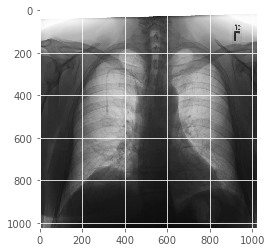

In [6]:
plt.imshow(a.pixel_array, cmap=pylab.cm.binary)

In [7]:
file_names = []
files =[]

X_train = defaultdict()
                
for i, image_path in enumerate(glob.glob("train/*.dcm")):
    pic = pydicom.read_file(image_path)
    files.append(pic.pixel_array)
    file_names.append(image_path.split('\\')[1].replace('.dcm',''))
    if i >= 15:
        break
    

In [7]:
X_train = {}
          
for i, image_path in enumerate(glob.glob("train/*.dcm")):
    pic = pydicom.read_file(image_path)
    X_train[image_path.split('\\')[1].replace('.dcm','')] = (pic.PatientAge, pic.PatientSex)#, pic.pixel_array)
    #if i >= 1000:
    #    break

In [12]:
y_train = pd.read_csv("train/stage_1_train_labels.csv")
y_train.head()

y_train_dict = defaultdict()
for name, x, y, width, height,_ in y_train.values:
    if not np.isnan(x):
        y_train_dict.setdefault(name, []).append([x,y,width,height])

In [10]:
age_gender = pd.DataFrame(X_train).transpose()
age_gender.head()

,0,1
0004cfab-14fd-4e49-80ba-63a80b6bddd6,51,F
00313ee0-9eaa-42f4-b0ab-c148ed3241cd,48,F
00322d4d-1c29-4943-afc9-b6754be640eb,19,M
003d8fa0-6bf1-40ed-b54c-ac657f8495c5,28,M
00436515-870c-4b36-a041-de91049b9ab4,32,F


In [32]:
y_train_dict.get('00f08de1-517e-4652-a04f-d1dc9ee48593')

[[181.0, 184.0, 206.0, 506.0], [571.0, 275.0, 230.0, 476.0]]

In [53]:
y_train_dict.get(age_gender.reset_index().loc[4]['index'])

[[264.0, 152.0, 213.0, 379.0], [562.0, 152.0, 256.0, 453.0]]

In [61]:
age_gender['sick_flag'] = (age_gender.index).isin(y_train_dict.keys())

In [63]:
age_gender.head()

,0,1,sick_flag
0004cfab-14fd-4e49-80ba-63a80b6bddd6,51,F,False
00313ee0-9eaa-42f4-b0ab-c148ed3241cd,48,F,False
00322d4d-1c29-4943-afc9-b6754be640eb,19,M,False
003d8fa0-6bf1-40ed-b54c-ac657f8495c5,28,M,False
00436515-870c-4b36-a041-de91049b9ab4,32,F,True


In [72]:
age_gender[0] = age_gender[0].astype(int)

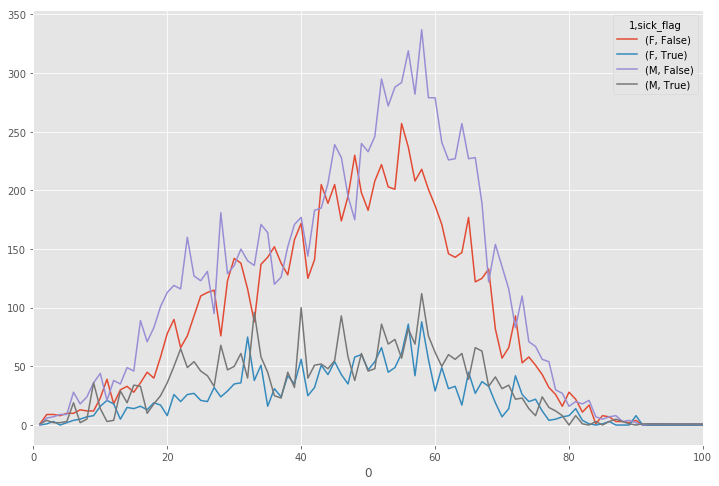

In [80]:
pd.crosstab(index = [age_gender[0]], columns= [age_gender[1], age_gender['sick_flag']]).plot(figsize = (12,8), xlim = (0,100))

In [82]:
def decade(x):
    if x[0]< 10:
        return "0-9"
    elif x[0] < 20:
        return "10-19"
    elif x[0] < 30:
        return "20-29"
    elif x[0] < 40:
        return "30-39"
    elif x[0] < 50:
        return "40-49"
    elif x[0] < 60:
        return "50-59"
    elif x[0] < 70:
        return "60-69"
    elif x[0] < 80:
        return "70-79"
    else:
        return ">= 80"

age_gender['decade'] = age_gender.apply(decade, axis = 1)

In [84]:
age_gender.head()

,0,1,sick_flag,decade
0004cfab-14fd-4e49-80ba-63a80b6bddd6,51,F,False,50-59
00313ee0-9eaa-42f4-b0ab-c148ed3241cd,48,F,False,40-49
00322d4d-1c29-4943-afc9-b6754be640eb,19,M,False,10-19
003d8fa0-6bf1-40ed-b54c-ac657f8495c5,28,M,False,20-29
00436515-870c-4b36-a041-de91049b9ab4,32,F,True,30-39


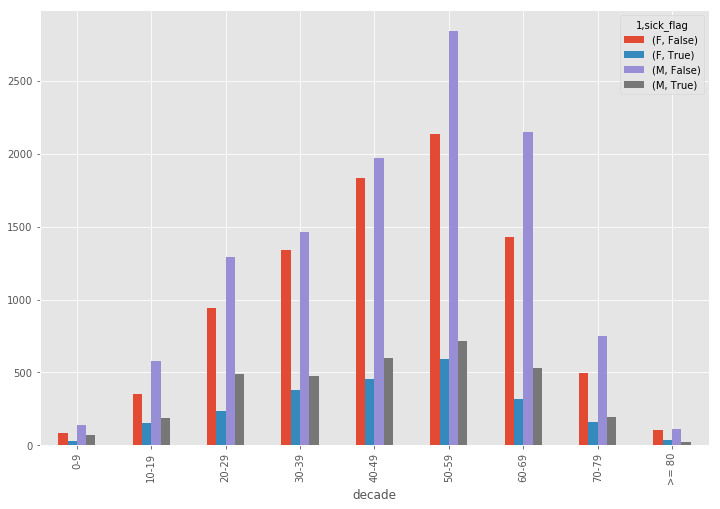

In [86]:
pd.crosstab(index = [age_gender['decade']], columns= [age_gender[1], age_gender['sick_flag']]).plot(kind = 'bar', figsize = (12,8), xlim = (0,100))

In [130]:
pvt = age_gender.pivot_table(values = 'sick_flag', index = ['decade', 1,'sick_flag'], aggfunc = 'count')
pvt2 = pvt/pvt.groupby(level = [0,1]).transform(sum)
pvt2 

0
decade 1 sick_flag          
0-9    F False      0.736842
         True       0.263158
       M False      0.649289
         True       0.350711
10-19  F False      0.694444
         True       0.305556
       M False      0.753264
         True       0.246736
20-29  F False      0.801364
         True       0.198636
       M False      0.725336
         True       0.274664
30-39  F False      0.777713
         True       0.222287
       M False      0.755281
         True       0.244719
40-49  F False      0.800524
         True       0.199476
       M False      0.767913
         True       0.232087
50-59  F False      0.782577
         True       0.217423
       M False      0.798371
         True       0.201629
60-69  F False      0.817456
         True       0.182544
       M False      0.801940
         True       0.198060
70-79  F False      0.756881
         True       0.243119
       M False      0.796809
         True       0.203191
>= 80  F False      0.734694
         True       0.265306
       M False      0.815603
         True       0.184397

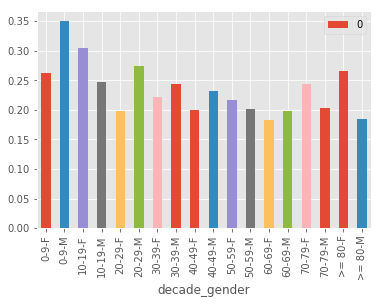

In [163]:
pvt3 = pvt2.reset_index()
pvt3['decade_gender'] =  pvt3["decade"] + "-" + pvt3[1] 
pvt3.loc[pvt3['sick_flag'] == True,['decade_gender',0]].plot(kind = 'bar', x = 'decade_gender', y = 0)

In [166]:
X_train = {}
          
for i, image_path in enumerate(glob.glob("train/*.dcm")):
    pic = pydicom.read_file(image_path)
    X_train[image_path.split('\\')[1].replace('.dcm','')] = (pic.PatientAge, pic.PatientSex, pic.pixel_array)
    if i >= 1000:
        break


In [167]:
for n, (i,j) in enumerate(X_train.items()):
    if n > 5:
        break
    print(i,j[0],j[1],j[2][0:5])

0004cfab-14fd-4e49-80ba-63a80b6bddd6 51 F [[144 128 114 ..., 176 184 117]
 [125 109  95 ..., 171 178 111]
 [104  89  75 ..., 166 175 108]
 [ 88  74  61 ..., 157 170 108]
 [ 70  57  46 ..., 143 160 104]]
00313ee0-9eaa-42f4-b0ab-c148ed3241cd 48 F [[ 31  24  19 ..., 191 183 176]
 [ 30  23  17 ..., 127 128 128]
 [ 29  22  16 ...,  90  95  98]
 [ 29  22  15 ...,  67  73  78]
 [ 30  22  15 ...,  52  57  61]]
00322d4d-1c29-4943-afc9-b6754be640eb 19 M [[ 4 12 11 ..., 11 12  3]
 [12 20 18 ..., 20 20 11]
 [10 18 17 ..., 19 19  9]
 [10 18 17 ..., 19 18  9]
 [11 19 18 ..., 20 19 10]]
003d8fa0-6bf1-40ed-b54c-ac657f8495c5 28 M [[209 211 212 ..., 235 245 160]
 [209 208 207 ..., 232 243 160]
 [208 205 201 ..., 227 238 155]
 [204 200 196 ..., 223 235 154]
 [197 193 190 ..., 222 236 156]]
00436515-870c-4b36-a041-de91049b9ab4 32 F [[0 1 2 ..., 2 2 2]
 [0 1 2 ..., 2 2 2]
 [0 1 2 ..., 3 3 3]
 [0 1 3 ..., 3 3 3]
 [0 1 3 ..., 3 3 3]]
00569f44-917d-4c86-a842-81832af98c30 54 M [[ 1  1  1 ..., 31 29 26]
 [ 0  1

In [168]:
for i,(k,v) in enumerate(y_train_dict.items()):
    if i >3:
        break
    print(k, "-", v)

00436515-870c-4b36-a041-de91049b9ab4 - [[264.0, 152.0, 213.0, 379.0], [562.0, 152.0, 256.0, 453.0]]
00704310-78a8-4b38-8475-49f4573b2dbb - [[323.0, 577.0, 160.0, 104.0], [695.0, 575.0, 162.0, 137.0]]
00aecb01-a116-45a2-956c-08d2fa55433f - [[288.0, 322.0, 94.0, 135.0], [547.0, 299.0, 119.0, 165.0]]
00c0b293-48e7-4e16-ac76-9269ba535a62 - [[306.0, 544.0, 168.0, 244.0], [650.0, 511.0, 206.0, 284.0]]


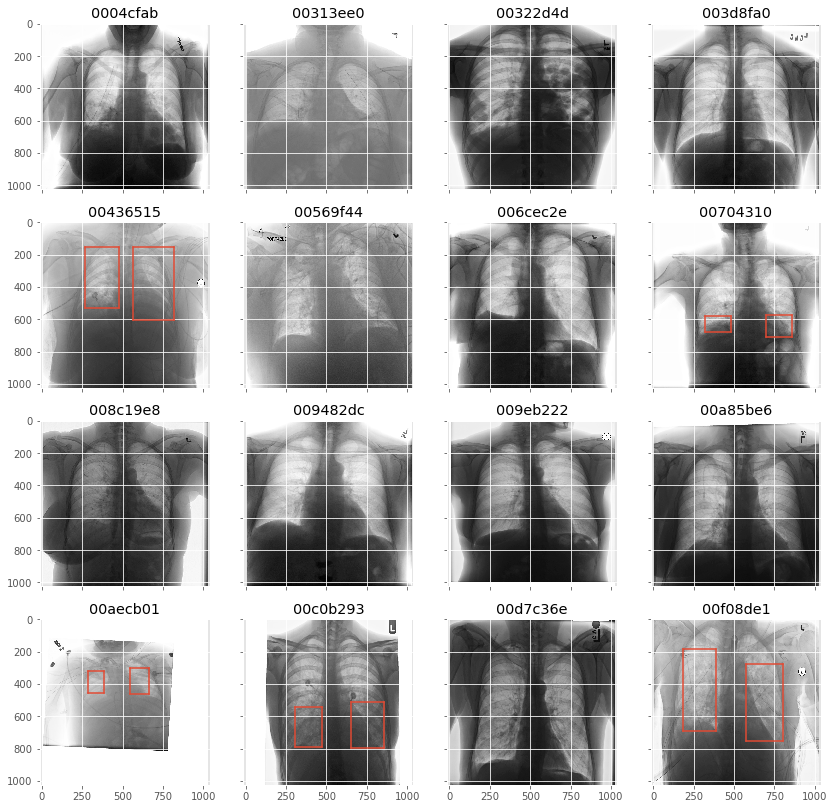

In [169]:
fig, axes = plt.subplots(nrows=4, ncols=4, sharex=True, sharey=True, figsize=(14,14))
axes_list = [item for sublist in axes for item in sublist] 
for n, (i,j) in enumerate(X_train.items()):
    if n >15:
        break
    ax1 = axes_list.pop(0)
    ax1.imshow(j[2], cmap=pylab.cm.binary)
    ax1.set_ylim((1024, 0))
    ax1.set_xlim((0, 1024))
    ax1.set_title(i[0:8])
    
    trues = y_train_dict.get(i)
    if trues is not None:
        for x, y, width, height in trues:
            if not np.isnan(x):
        #         ax1.add_patch(Rectangle(xy = (x,y),width = width,height = height, alpha = .2))
                 lines = [Line2D([x,x],[y,y+height]),
                          Line2D([x+width,x+width],[y,y+height]),
                          Line2D([x,x+width],[y,y]),
                          Line2D([x,x+width],[y+height,y+height])]
        #        lines = [Line2D([80,80],[100,500], linewidth = 60, alpha = .2)]
                 for l in lines:
                     ax1.add_line(l)
    

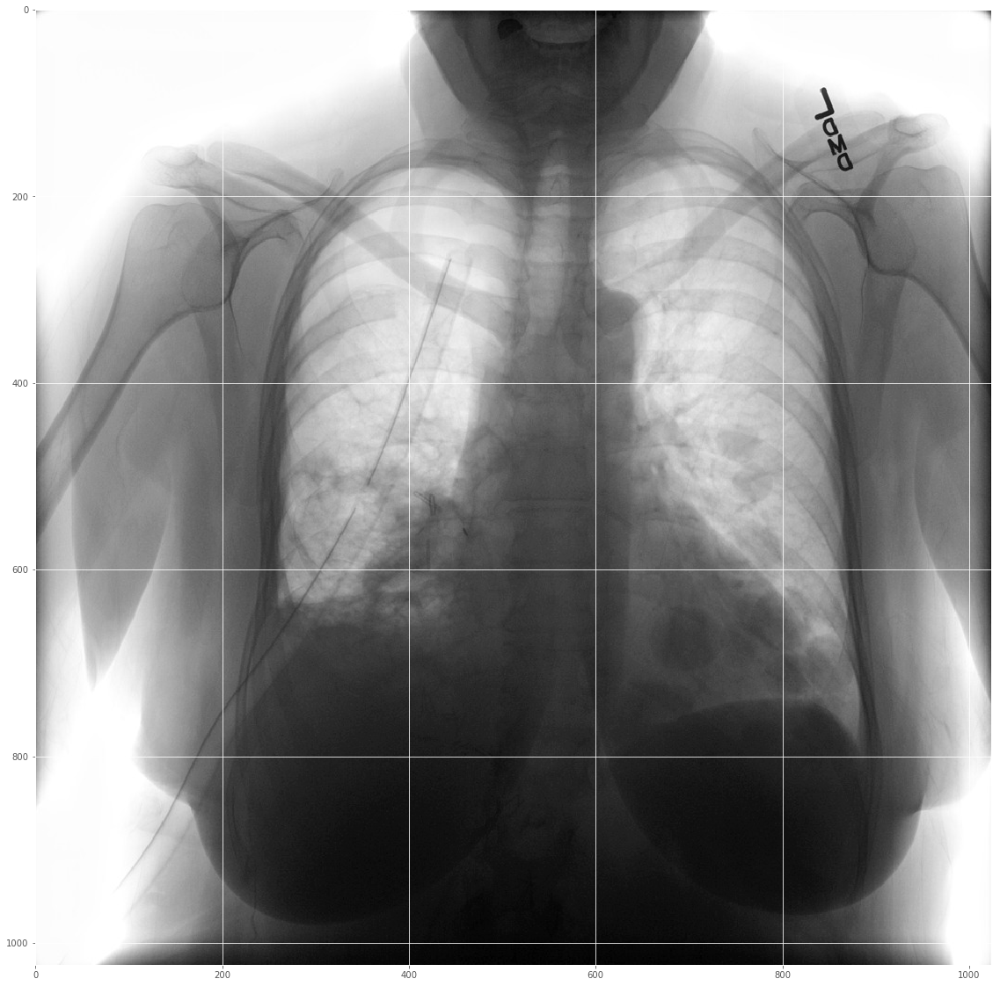

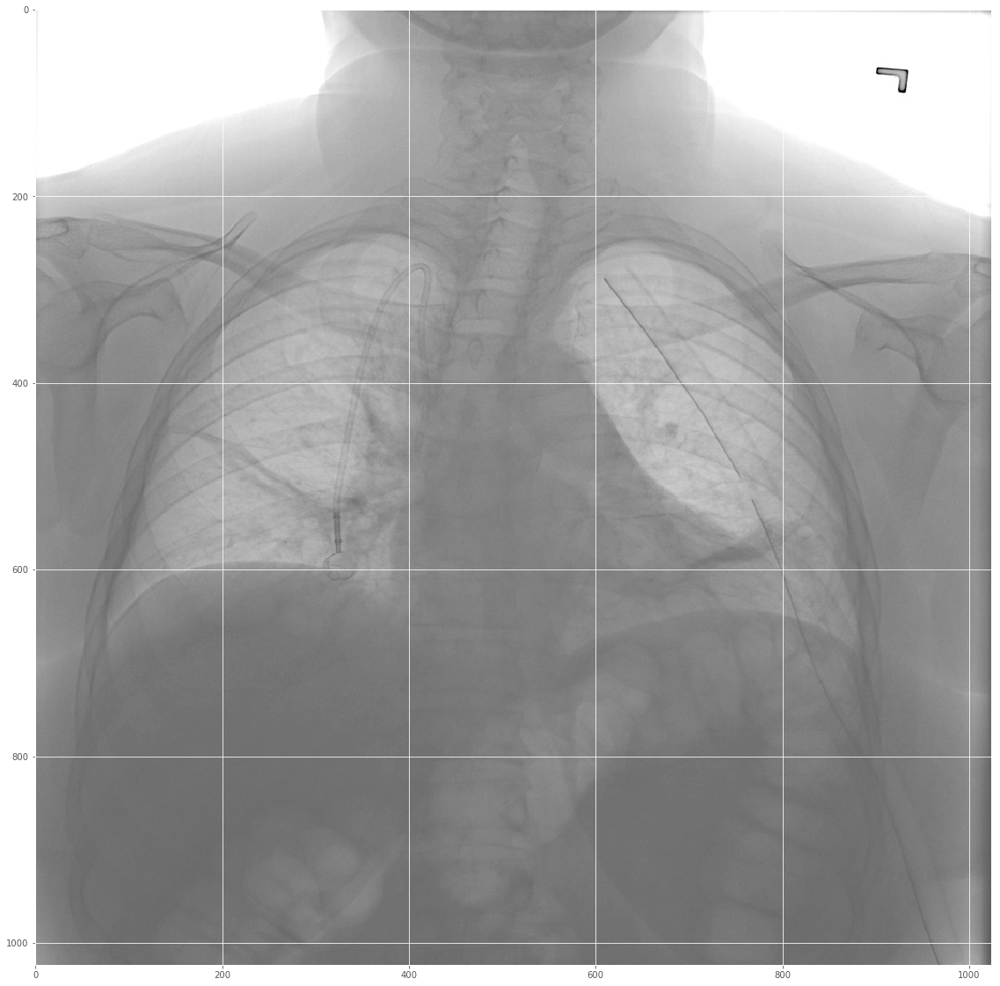

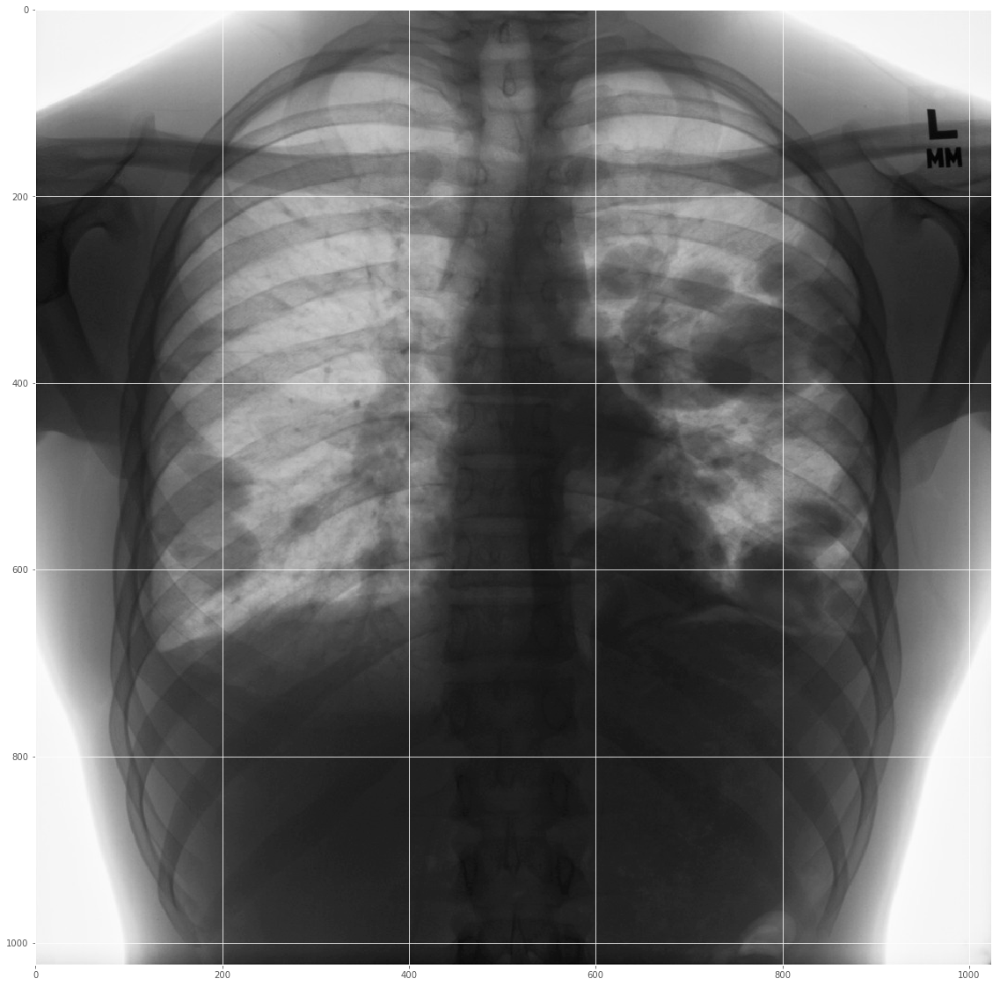

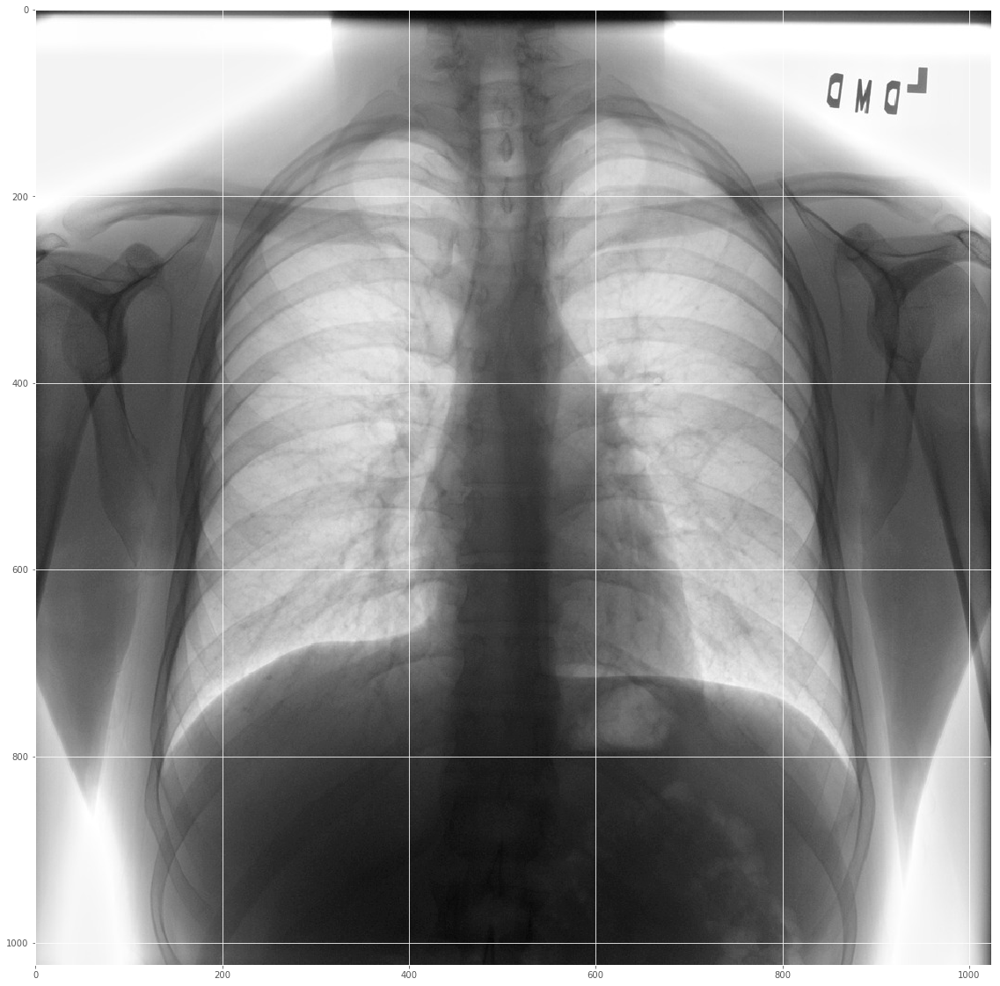

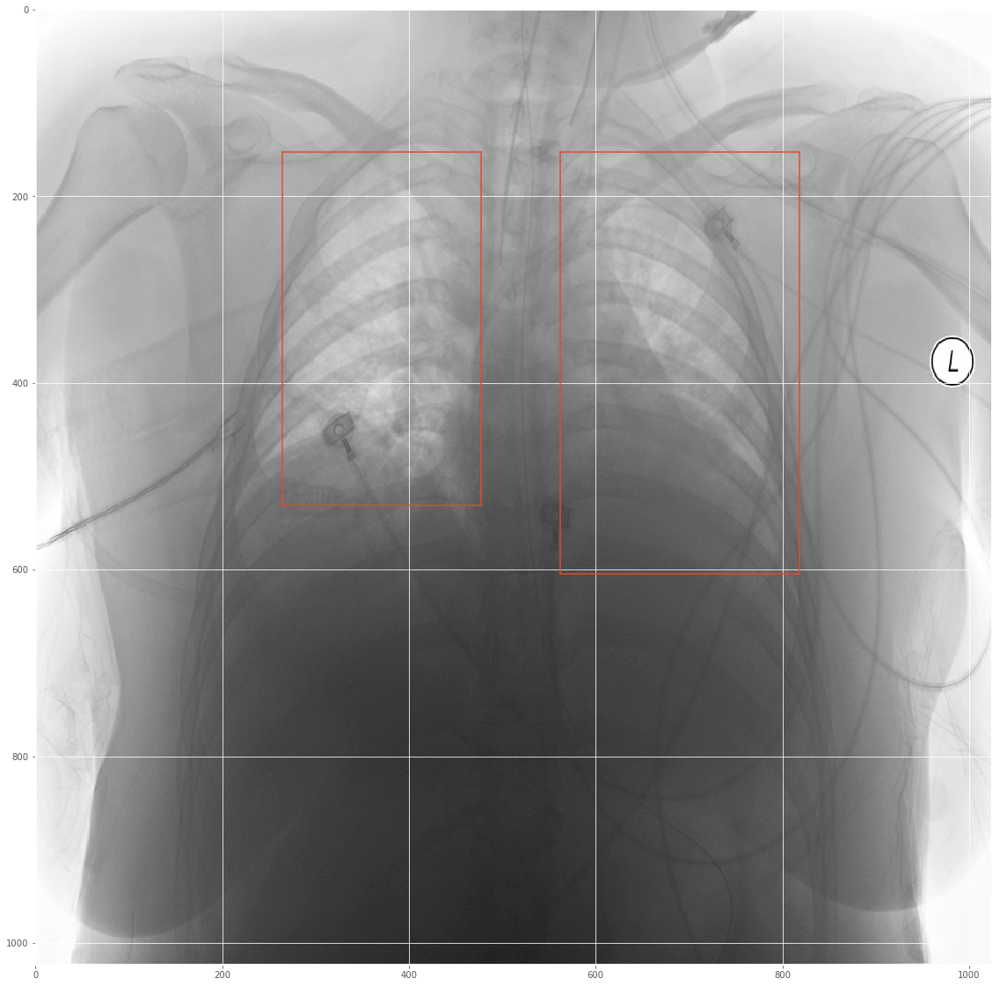

...

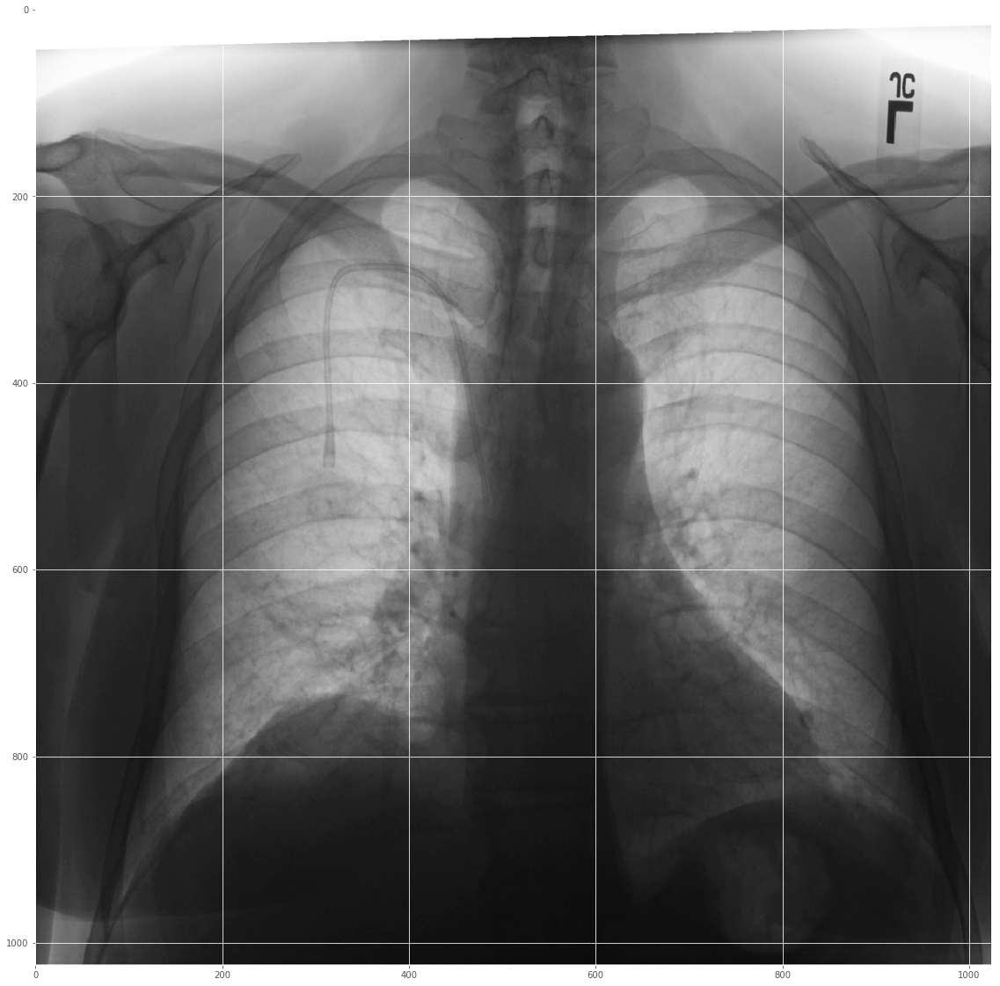

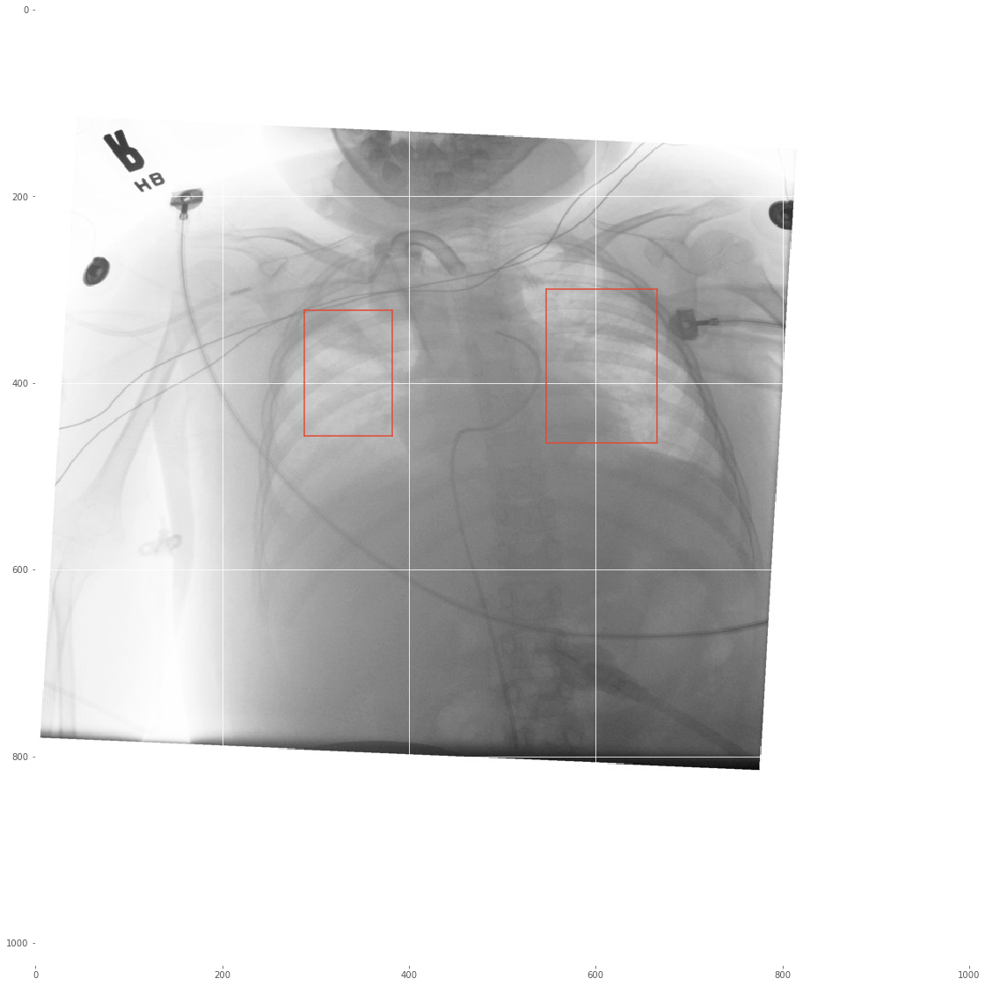

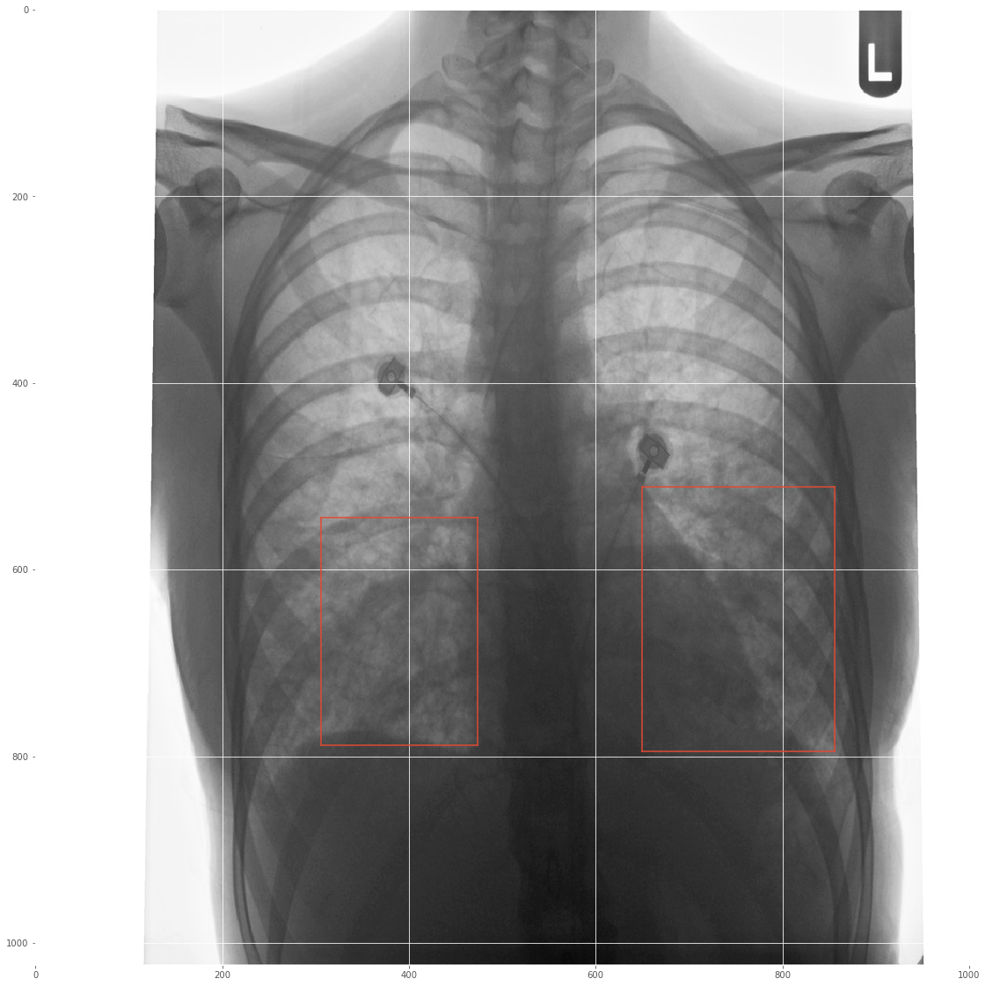

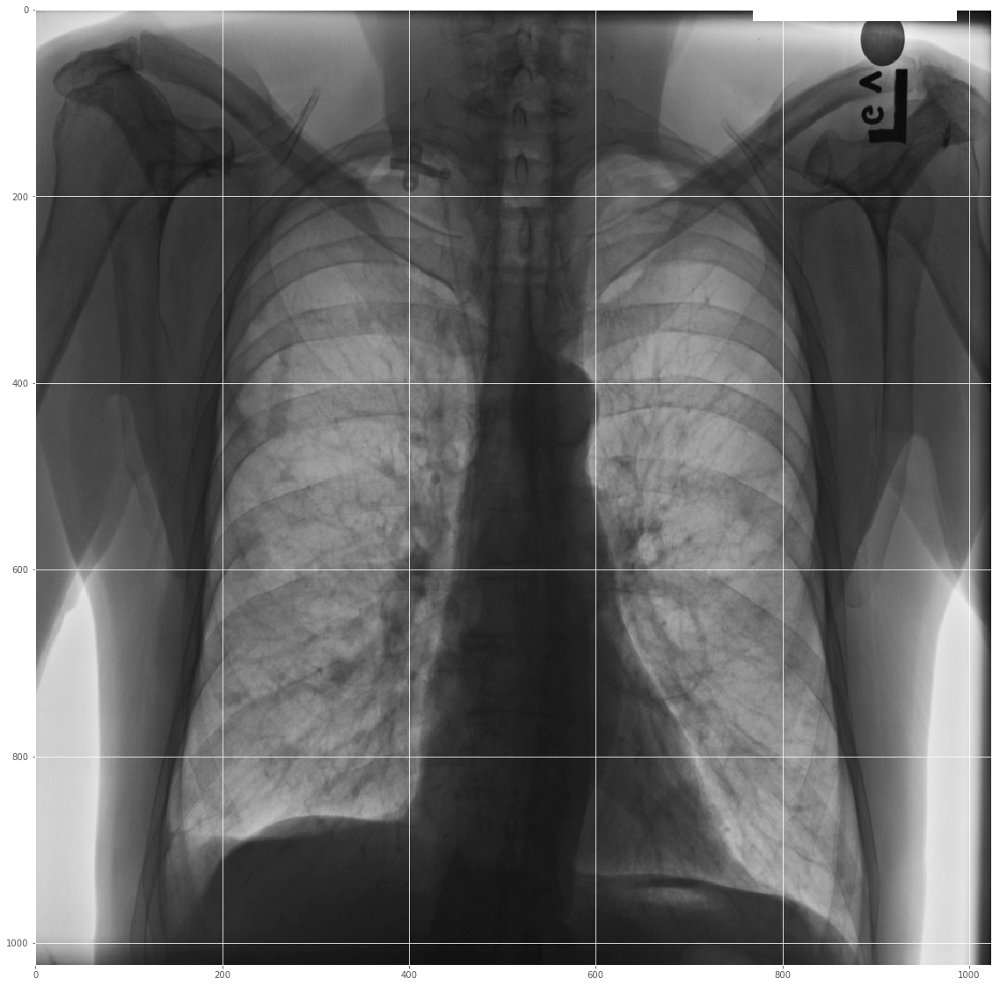

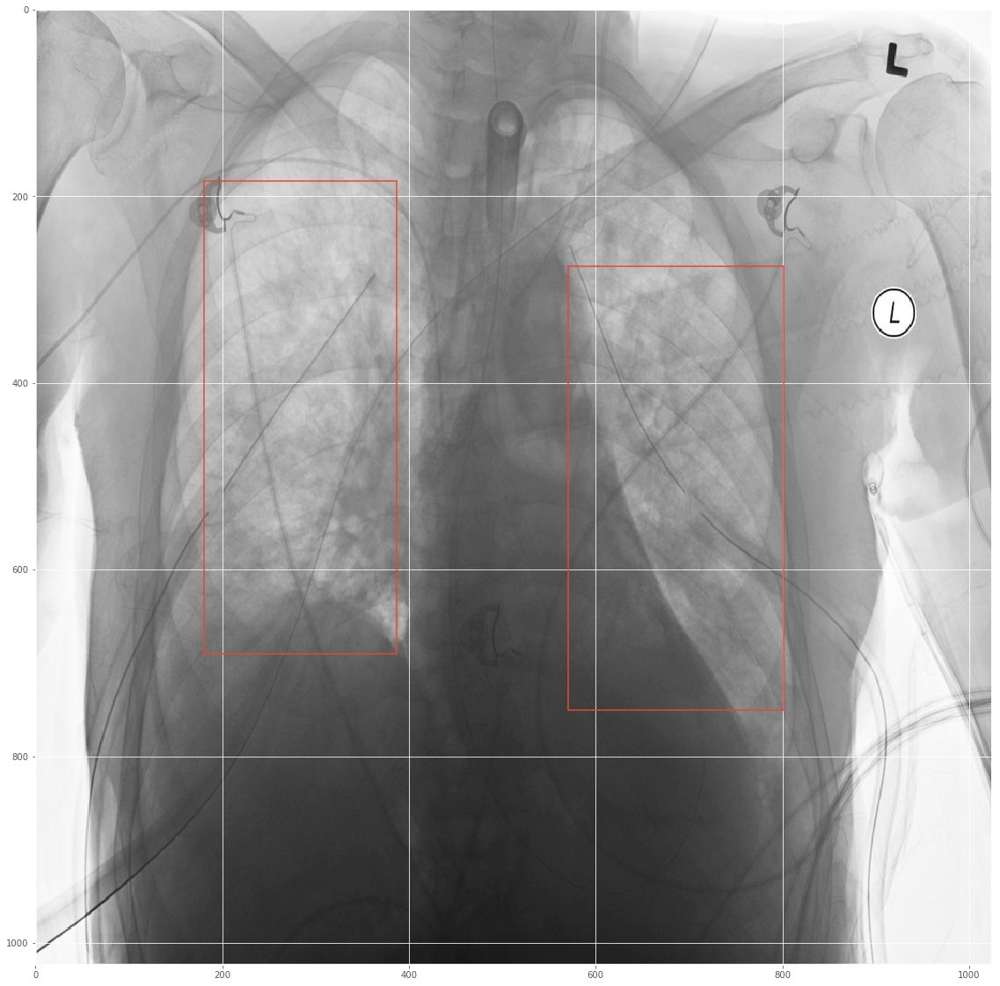

In [173]:
for n, (i,j) in enumerate(X_train.items()):
    if n > 15:
        break
    fig, ax1 = plt.subplots(figsize= (20,20))    
    #plt.figure(figsize = (20,20))
    ax1.imshow(j[2], cmap=pylab.cm.binary)

    trues = y_train_dict.get(i)
    if trues is not None:
        for x, y, width, height in trues:
             lines = [Line2D([x,x],[y,y+height]),
                  Line2D([x+width,x+width],[y,y+height]),
                  Line2D([x,x+width],[y,y]),
                  Line2D([x,x+width],[y+height,y+height])]
             for l in lines:
                 ax1.add_line(l)
    plt.show()


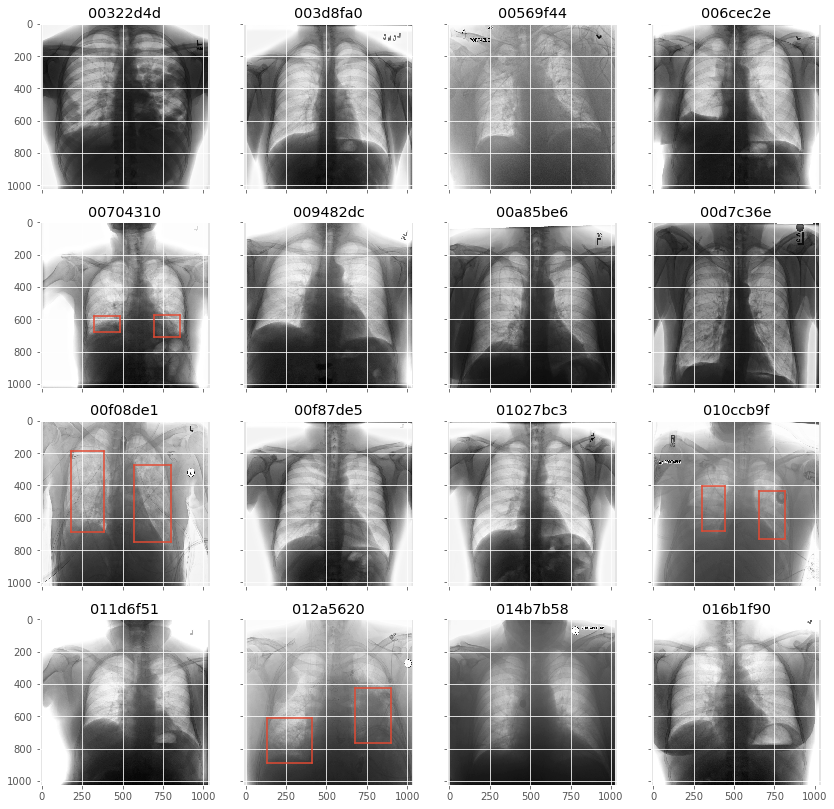

In [177]:
# Compare males
fig, axes = plt.subplots(nrows=4, ncols=4, sharex=True, sharey=True, figsize=(14,14))
axes_list = [item for sublist in axes for item in sublist] 
n= 0
for i,j in X_train.items():    
    if n >15:
        break
    if j[1] == 'M':
        n = n+1
        ax1 = axes_list.pop(0)
        ax1.imshow(j[2], cmap=pylab.cm.binary)
        ax1.set_ylim((1024, 0))
        ax1.set_xlim((0, 1024))
        ax1.set_title(i[0:8])

        trues = y_train_dict.get(i)
        if trues is not None:
            for x, y, width, height in trues:
                if not np.isnan(x):
                     lines = [Line2D([x,x],[y,y+height]),
                              Line2D([x+width,x+width],[y,y+height]),
                              Line2D([x,x+width],[y,y]),
                              Line2D([x,x+width],[y+height,y+height])]
                     for l in lines:
                         ax1.add_line(l)

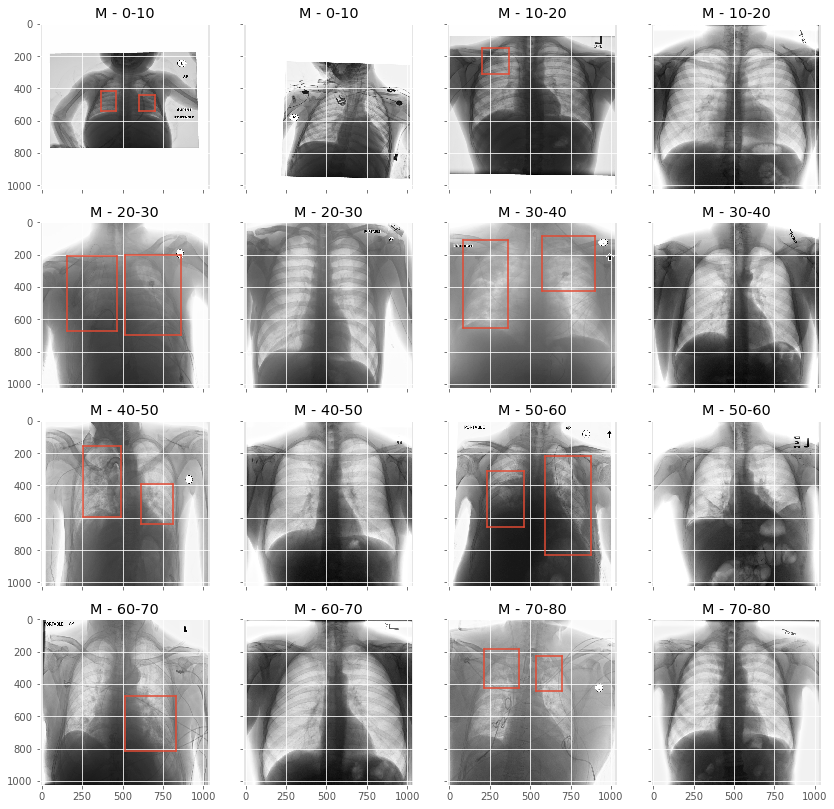

In [191]:
# Compare males
fig, axes = plt.subplots(nrows=4, ncols=4, sharex=True, sharey=True, figsize=(14,14))
axes_list = [item for sublist in axes for item in sublist] 
n= 0
for i,j in X_train.items():    
    if n >15:
        break
    
    thresh = math.floor(n/2)*10
    if j[1] == 'M' and n % 2 == 0:
        if int(j[0])>= thresh and int(j[0])< (thresh + 10) and y_train_dict.get(i) is not None:
            n = n+1
            ax1 = axes_list.pop(0)
            ax1.imshow(j[2], cmap=pylab.cm.binary)
            ax1.set_ylim((1024, 0))
            ax1.set_xlim((0, 1024))
            ax1.set_title("M - " + str(thresh) + "-" + str(thresh+10))

            trues = y_train_dict.get(i)
            if trues is not None:
                for x, y, width, height in trues:
                    if not np.isnan(x):
                         lines = [Line2D([x,x],[y,y+height]),
                                  Line2D([x+width,x+width],[y,y+height]),
                                  Line2D([x,x+width],[y,y]),
                                  Line2D([x,x+width],[y+height,y+height])]
                         for l in lines:
                             ax1.add_line(l)

    elif j[1] == 'M':
        if int(j[0])>= thresh and int(j[0])< (thresh + 10) and y_train_dict.get(i) is None:
            n = n+1
            ax1 = axes_list.pop(0)
            ax1.imshow(j[2], cmap=pylab.cm.binary)
            ax1.set_ylim((1024, 0))
            ax1.set_xlim((0, 1024))
            ax1.set_title("M - " + str(thresh) + "-" + str(thresh+10))

            trues = y_train_dict.get(i)
            if trues is not None:
                for x, y, width, height in trues:
                    if not np.isnan(x):
                         lines = [Line2D([x,x],[y,y+height]),
                                  Line2D([x+width,x+width],[y,y+height]),
                                  Line2D([x,x+width],[y,y]),
                                  Line2D([x,x+width],[y+height,y+height])]
                         for l in lines:
                             ax1.add_line(l)


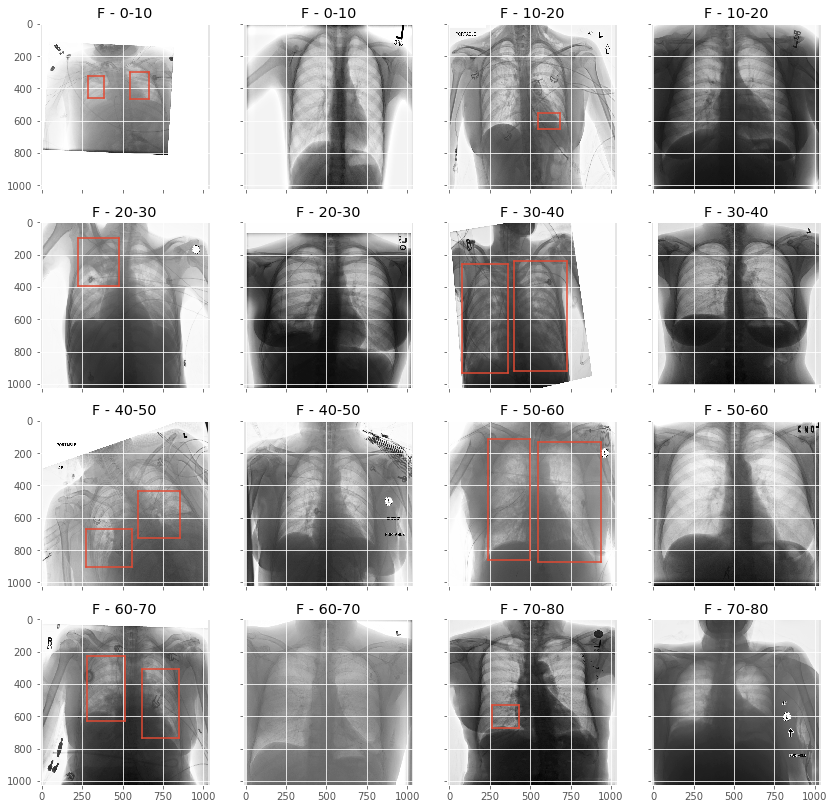

In [193]:
# Compare males
fig, axes = plt.subplots(nrows=4, ncols=4, sharex=True, sharey=True, figsize=(14,14))
axes_list = [item for sublist in axes for item in sublist] 
n= 0
for i,j in X_train.items():    
    if n >15:
        break
    
    thresh = math.floor(n/2)*10
    if j[1] == 'F' and n % 2 == 0:
        if int(j[0])>= thresh and int(j[0])< (thresh + 10) and y_train_dict.get(i) is not None:
            n = n+1
            ax1 = axes_list.pop(0)
            ax1.imshow(j[2], cmap=pylab.cm.binary)
            ax1.set_ylim((1024, 0))
            ax1.set_xlim((0, 1024))
            ax1.set_title("F - " + str(thresh) + "-" + str(thresh+10))

            trues = y_train_dict.get(i)
            if trues is not None:
                for x, y, width, height in trues:
                    if not np.isnan(x):
                         lines = [Line2D([x,x],[y,y+height]),
                                  Line2D([x+width,x+width],[y,y+height]),
                                  Line2D([x,x+width],[y,y]),
                                  Line2D([x,x+width],[y+height,y+height])]
                         for l in lines:
                             ax1.add_line(l)

    elif j[1] == 'F':
        if int(j[0])>= thresh and int(j[0])< (thresh + 10) and y_train_dict.get(i) is None:
            n = n+1
            ax1 = axes_list.pop(0)
            ax1.imshow(j[2], cmap=pylab.cm.binary)
            ax1.set_ylim((1024, 0))
            ax1.set_xlim((0, 1024))
            ax1.set_title("F - " + str(thresh) + "-" + str(thresh+10))

            trues = y_train_dict.get(i)
            if trues is not None:
                for x, y, width, height in trues:
                    if not np.isnan(x):
                         lines = [Line2D([x,x],[y,y+height]),
                                  Line2D([x+width,x+width],[y,y+height]),
                                  Line2D([x,x+width],[y,y]),
                                  Line2D([x,x+width],[y+height,y+height])]
                         for l in lines:
                             ax1.add_line(l)

In [203]:
male_infant_healthy = []
male_infant_sick = []
male_ad_healthy = []
male_ad_sick = []
male_adult_healthy = []
male_adult_sick = []
male_elder_healthy = []
male_elder_sick = []

female_infant_healthy = []
female_infant_sick = []
female_ad_healthy = []
female_ad_sick = []
female_adult_healthy = []
female_adult_sick = []
female_elder_healthy = []
female_elder_sick = []

for i,j in X_train.items():
    if j[1] == "M":
        if int(j[0]) <6:
            if y_train_dict.get(i) is None:
                male_infant_healthy.append(j[2])
            else:
                male_infant_sick.append(j[2])
        elif int(j[0]) <19:
            if y_train_dict.get(i) is None:
                male_ad_healthy.append(j[2])
            else:
                male_ad_sick.append(j[2])                
        elif int(j[0]) <60:
            if y_train_dict.get(i) is None:
                male_adult_healthy.append(j[2])
            else:
                male_adult_sick.append(j[2])
        else:
            if y_train_dict.get(i) is None:
                male_elder_healthy.append(j[2])
            else:
                male_elder_sick.append(j[2])
    elif j[1] == "F":
        if int(j[0]) <6:
            if y_train_dict.get(i) is None:
                female_infant_healthy.append(j[2])
            else:
                female_infant_sick.append(j[2])
        elif int(j[0]) <19:
            if y_train_dict.get(i) is None:
                female_ad_healthy.append(j[2])
            else:
                female_ad_sick.append(j[2])                
        elif int(j[0]) <60:
            if y_train_dict.get(i) is None:
                female_adult_healthy.append(j[2])
            else:
                female_adult_sick.append(j[2])
        else:
            if y_train_dict.get(i) is None:
                female_elder_healthy.append(j[2])
            else:
                female_elder_sick.append(j[2])

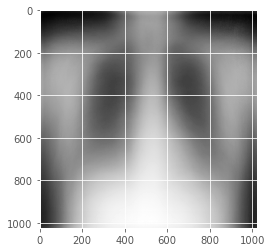

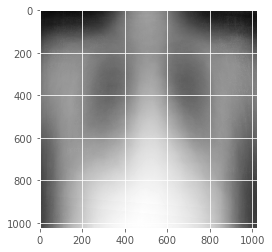

In [242]:
madh = np.asarray(male_adult_healthy)
madh_a = madh.mean(axis =0)
plt.imshow(madh_a, cmap='gray')
plt.show()
mads = np.asarray(male_adult_sick)
mads_a = mads.mean(axis =0)
plt.imshow(mads_a, cmap='gray')

In [249]:
madh.shape

(272, 1024, 1024)

In [251]:
madh.reshape((272, 1024*1024)).shape

(272, 1048576)

In [252]:
from sklearn.preprocessing import scale
files_norm_scale = scale(madh.reshape((272, 1024*1024)), with_std=False)

In [253]:
files_norm_scale.shape

(272, 1048576)

In [254]:
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(files_norm_scale)
print(pca.explained_variance_ratio_)  
print(pca.singular_values_)  

[  2.75113483e-01   1.08352788e-01   8.55719321e-02   7.16226479e-02
   6.67703382e-02   4.77009599e-02   2.32284173e-02   2.03601961e-02
   1.77217756e-02   1.49749767e-02   1.36311891e-02   1.16861915e-02
   1.11696411e-02   9.57045369e-03   9.12109278e-03   8.84686929e-03
   8.30896851e-03   7.52921539e-03   6.40580467e-03   6.14834734e-03
   5.86719689e-03   5.33219587e-03   5.10831462e-03   4.86732987e-03
   4.59646895e-03   4.24241766e-03   3.86670096e-03   3.63900705e-03
   3.39269019e-03   3.27154549e-03   3.05367666e-03   3.01754047e-03
   2.92937406e-03   2.74656278e-03   2.69953964e-03   2.55332258e-03
   2.43831593e-03   2.38489357e-03   2.27351621e-03   2.20138010e-03
   2.07482791e-03   1.96999993e-03   1.87924795e-03   1.86500729e-03
   1.72562728e-03   1.70254158e-03   1.66917195e-03   1.61813531e-03
   1.52775413e-03   1.48900113e-03   1.44369712e-03   1.42164940e-03
   1.39019416e-03   1.32504434e-03   1.29415242e-03   1.23473537e-03
   1.20455923e-03   1.19631123e-03

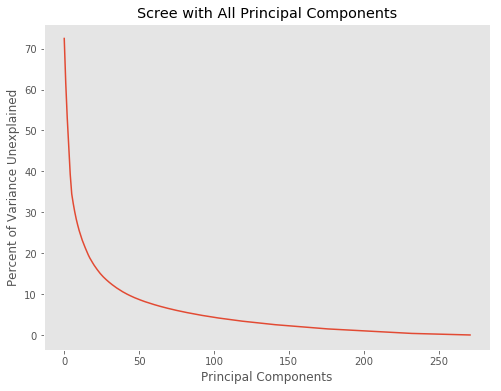

In [255]:
var= pca.explained_variance_ratio_
var1=100 - np.cumsum(np.round(pca.explained_variance_ratio_, decimals=4)*100)

plt.figure(figsize = (8,6))
plt.grid()
plt.xlabel("Principal Components")
plt.ylabel("Percent of Variance Unexplained")
plt.plot(var1)
plt.title("Scree with All Principal Components")

In [256]:
var1[0:10]

array([ 72.49,  61.65,  53.09,  45.93,  39.25,  34.48,  32.16,  30.12,
        28.35,  26.85])

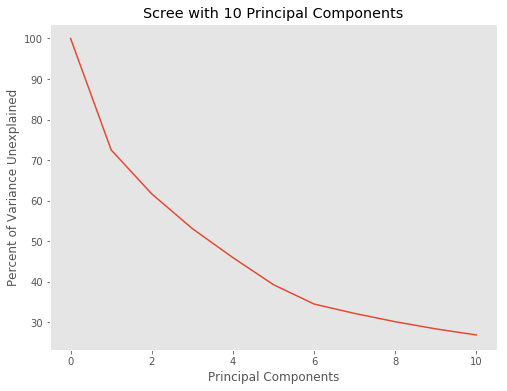

In [257]:
a = [100]
[a.append(i) for i in var1[0:10]]

plt.figure(figsize = (8,6))
plt.grid()
plt.xlabel("Principal Components")
plt.ylabel("Percent of Variance Unexplained")
plt.plot(a)
plt.title("Scree with 10 Principal Components")


In [258]:
E = pca.components_

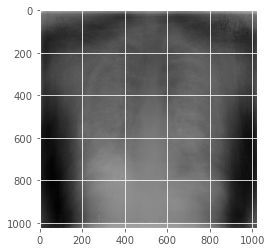

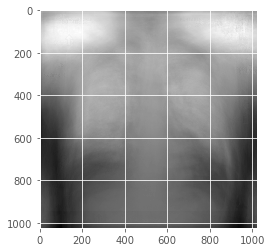

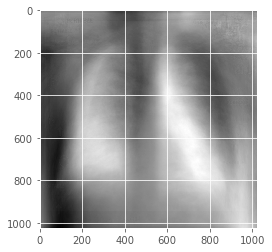

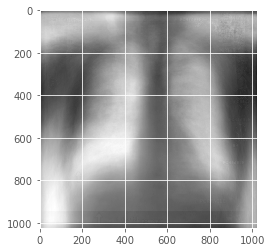

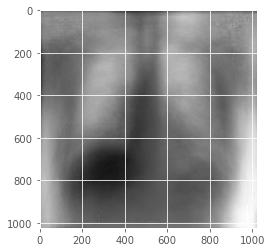

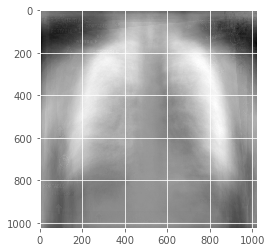

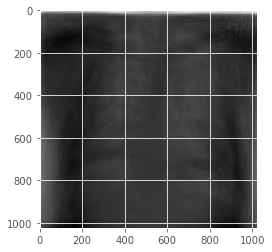

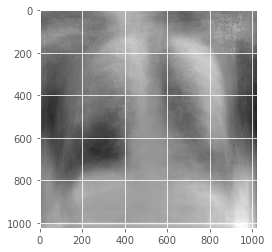

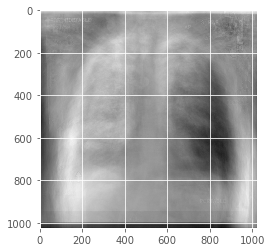

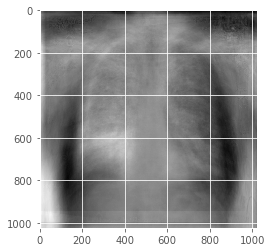

In [259]:
count = 100

for i in pca.components_[0:10]:
    fig, ax = plt.subplots()
    i = i.reshape((1024, 1024))
    plt.imshow(i, cmap = "gray")
    
plt.show()